# Importing the Libraries

In [25]:

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# !pip install gensim # Gensim is an open-source library for unsupervised topic modeling and natural language processing
import nltk
# nltk.download('punkt')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS
import nltk
import re
from nltk.corpus import stopwords
import seaborn as sns 
import gensim
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS

import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score



# Reading the Dataset

In [3]:
df_true = pd.read_csv("./True.csv")
df_fake = pd.read_csv("./Fake.csv")

**Setting up a target variable and combining both the real and fake news datasets**

In [4]:
df_true['target'] = 1
df_fake['target'] = 0
df = pd.concat([df_true, df_fake]).reset_index(drop = True)
df['original'] = df['title'] + ' ' + df['text']
df.head()

,title,text,subject,date,target,original
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",1,"As U.S. budget fight looms, Republicans flip t..."
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",1,U.S. military to accept transgender recruits o...
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",1,Senior U.S. Republican senator: 'Let Mr. Muell...
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",1,FBI Russia probe helped by Australian diplomat...
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",1,Trump wants Postal Service to charge 'much mor...


**Lets take a note of the null values in the data**

In [5]:
df.isnull().sum()

title       0
text        0
subject     0
date        0
target      0
original    0
dtype: int64

# Data Cleaning

In [6]:
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use'])
def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 2 and token not in stop_words:
            result.append(token)
            
    return result

In [7]:
# Transforming the unmatching subjects to the same notation
df.subject=df.subject.replace({'politics':'PoliticsNews','politicsNews':'PoliticsNews'})

# Exploratory Data Analysis

# What is the distribution of Subjects between the True and Fake News? 

In [8]:
sub_tf_df=df.groupby('target').apply(lambda x:x['title'].count()).reset_index(name='Counts')
sub_tf_df.target.replace({0:'False',1:'True'},inplace=True)
fig = px.bar(sub_tf_df, x="target", y="Counts",
             color='Counts', barmode='group',
             height=400)
fig.show()

**Observation** The dataset looks really balanced and hence working on this is pretty easy. Thus we need not work on to make this dataset more balanced, and can safely assume this is a balanced dataset

# Which Subjects have received the most News Coverage?

In [9]:
sub_check=df.groupby('subject').apply(lambda x:x['title'].count()).reset_index(name='Counts')
fig=px.bar(sub_check,x='subject',y='Counts',color='Counts',title='Count of News Articles by Subject')
fig.show()

**Observations** Political News and World News hold the most domination counts in the data set that we have considered.

# Can the News Headline be enough to predict if the news if fake or not? Lets us see in the following analysis

In [10]:
df['clean_title'] = df['title'].apply(preprocess)
df['clean_title'][0]

['budget', 'fight', 'looms', 'republicans', 'flip', 'fiscal', 'script']

In [11]:
df['clean_joined_title']=df['clean_title'].apply(lambda x:" ".join(x))

# Lets Take a look at the Word Clouds for the Titles

# Word Cloud using the Real News Headlines

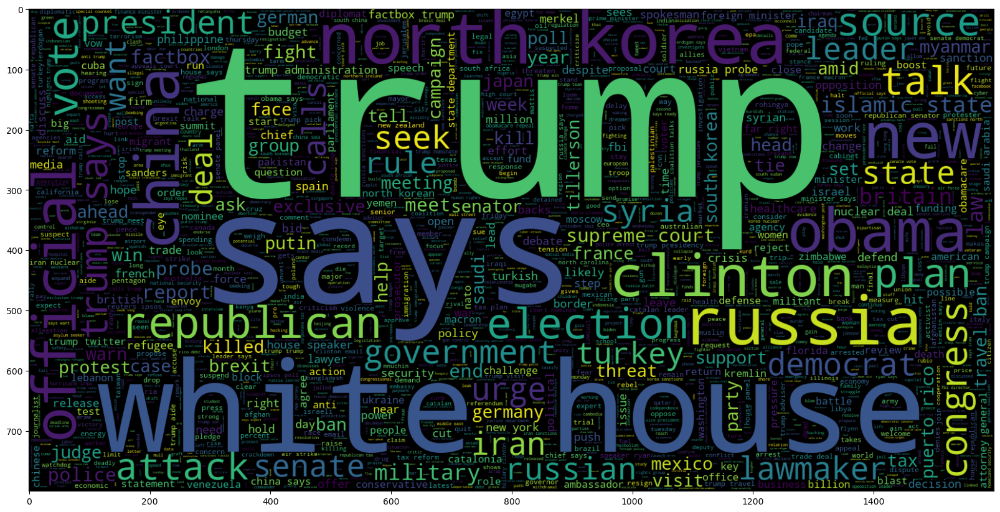

In [12]:
plt.figure(figsize = (20,20)) 
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800 , stopwords = stop_words).generate(" ".join(df[df.target == 1].clean_joined_title))
plt.imshow(wc, interpolation = 'bilinear')

# Word Cloud using the Fake News Headlines


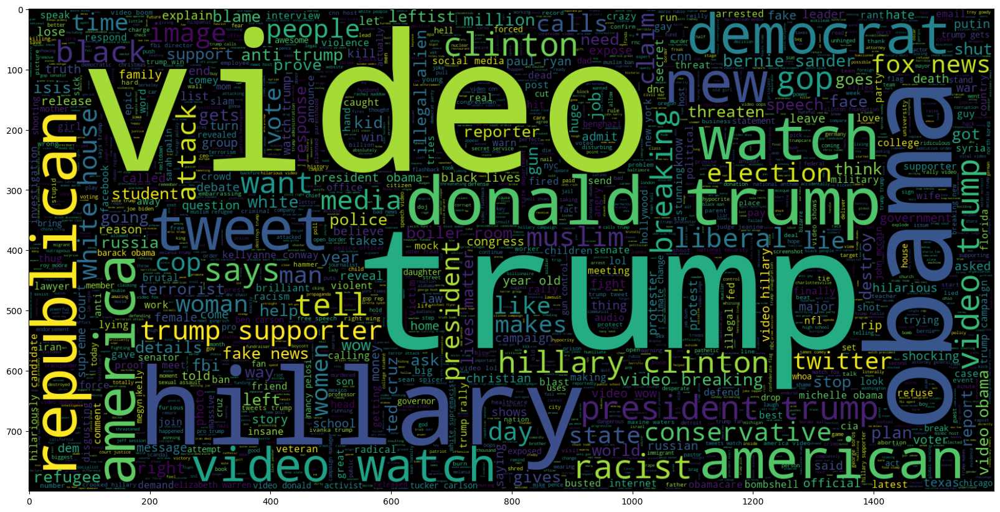

In [13]:
plt.figure(figsize = (20,20)) 
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800 , stopwords = stop_words).generate(" ".join(df[df.target == 0].clean_joined_title))
plt.imshow(wc, interpolation = 'bilinear')

# Lets Look at the Count of Words Distribution in the Title

In [14]:
maxlen = -1
for doc in df.clean_joined_title:
    tokens = nltk.word_tokenize(doc)
    if(maxlen<len(tokens)):
        maxlen = len(tokens)
print("The maximum number of words in a title is =", maxlen)
fig = px.histogram(x = [len(nltk.word_tokenize(x)) for x in df.clean_joined_title], nbins = 50)
fig.show()

The maximum number of words in a title is = 34


**Observation:** On an average, The maximum number of titles range between 7-8 words. Would be a bit tricky to judge if the news if true or fake only with these few words. So we hope we shall not be getting a great amount of accuracy using the title alone. Still lets move on to our prediction

### Feature Selection with Genetic Algorithm

In [35]:
def initilization_of_population(size,n_feat):
    population = []
    for i in range(size):
        chromosome = np.ones(n_feat,dtype=np.bool)     
        chromosome[:int(0.3*n_feat)]=False             
        np.random.shuffle(chromosome)
        population.append(chromosome)
    return population


def fitness_score(population):
    scores,precision, recall,f1 = [],[],[],[]
    for chromosome in population:
        logmodel.fit(X_train.iloc[:,chromosome],Y_train)         
        predictions = logmodel.predict(X_test.iloc[:,chromosome])
        scores.append(accuracy_score(Y_test,predictions))
        precision.append(precision_score(Y_test,predictions))
        recall.append(recall_score(Y_test,predictions))
        f1.append(f1_score(Y_test,predictions))
    scores, population = np.array(scores), np.array(population) 
    inds = np.argsort(scores) 
    
    print("BEST Precision:",  list(np.array(precision)[inds][::-1])[:1])
    print("BEST Recall:",  list(np.array(recall)[inds][::-1])[:1])
    print("BEST F1 score:",  list(np.array(f1)[inds][::-1])[:1])
    return list(scores[inds][::-1]), list(population[inds,:][::-1]) 


def selection(pop_after_fit,n_parents):
    population_nextgen = []
    for i in range(n_parents):
        population_nextgen.append(pop_after_fit[i])
    return population_nextgen


def crossover(pop_after_sel):
    pop_nextgen = pop_after_sel
    for i in range(0,len(pop_after_sel),2):
        new_par = []
        child_1 , child_2 = pop_nextgen[i] , pop_nextgen[i+1]
        new_par = np.concatenate((child_1[:len(child_1)//2],child_2[len(child_1)//2:]))
        pop_nextgen.append(new_par)
    return pop_nextgen


def mutation(pop_after_cross,mutation_rate,n_feat):   
    mutation_range = int(mutation_rate*n_feat)
    pop_next_gen = []
    for n in range(0,len(pop_after_cross)):
        chromo = pop_after_cross[n]
        rand_posi = [] 
        for i in range(0,mutation_range):
            pos = randint(0,n_feat-1)
            rand_posi.append(pos)
        for j in rand_posi:
            chromo[j] = not chromo[j]  
        pop_next_gen.append(chromo)
    return pop_next_gen

def generations(df,label,size,n_feat,n_parents,mutation_rate,n_gen,X_train,X_test, Y_train, Y_test):
    best_chromo= []
    best_score= []
    population_nextgen=initilization_of_population(size,n_feat)
    for i in range(n_gen):
        scores, pop_after_fit = fitness_score(population_nextgen)
        print('Best score in generation',i+1,':',scores[:1])  #2
        pop_after_sel = selection(pop_after_fit,n_parents)
        pop_after_cross = crossover(pop_after_sel)
        population_nextgen = mutation(pop_after_cross,mutation_rate,n_feat)
        best_chromo.append(pop_after_fit[0])
        best_score.append(scores[0])
    return best_chromo,best_score

In [16]:
df.head()

,title,text,subject,date,target,original,clean_title,clean_joined_title
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,PoliticsNews,"December 31, 2017",1,"As U.S. budget fight looms, Republicans flip t...","[budget, fight, looms, republicans, flip, fisc...",budget fight looms republicans flip fiscal script
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,PoliticsNews,"December 29, 2017",1,U.S. military to accept transgender recruits o...,"[military, accept, transgender, recruits, mond...",military accept transgender recruits monday pe...
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,PoliticsNews,"December 31, 2017",1,Senior U.S. Republican senator: 'Let Mr. Muell...,"[senior, republican, senator, let, mueller, job]",senior republican senator let mueller job
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,PoliticsNews,"December 30, 2017",1,FBI Russia probe helped by Australian diplomat...,"[fbi, russia, probe, helped, australian, diplo...",fbi russia probe helped australian diplomat ti...
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,PoliticsNews,"December 29, 2017",1,Trump wants Postal Service to charge 'much mor...,"[trump, wants, postal, service, charge, amazon...",trump wants postal service charge amazon shipm...


In [17]:
from gensim.models import Word2Vec

corpus = [text.split() for text in df['clean_joined_title']]
emb_size = 100
# Train Word2Vec model
model_w2v = Word2Vec(sentences=corpus, vector_size=emb_size, window=5, min_count=1, workers=4, sg=0)

In [18]:
meta_text_vec = []
for text in df['text']:
    vec = np.zeros(emb_size)
    tokens = text.split()
    for token in tokens:
        if token in model_w2v.wv:
            vec += model_w2v.wv[token]
    meta_text_vec.append(vec)
meta_text_vec = np.array(meta_text_vec)
meta_text_vec.shape

(44898, 100)

In [19]:
df_embed = pd.DataFrame(meta_text_vec,columns = ['embed_{}'.format(i) for i in range(meta_text_vec.shape[1])])
final_df = pd.concat([df_embed, df[['target']]],axis = 1)
final_df.head()

,embed_0,embed_1,embed_2,embed_3,embed_4,embed_5,embed_6,embed_7,embed_8,embed_9,...,embed_91,embed_92,embed_93,embed_94,embed_95,embed_96,embed_97,embed_98,embed_99,target
0,15.164201,88.315090,-19.881563,113.326234,-65.095044,-47.842854,40.224226,72.051255,-105.379786,-56.662813,...,123.944763,26.018042,43.079946,168.229321,49.701042,-73.065029,-53.002701,13.350741,-22.534387,1
1,14.447841,81.013336,-16.607386,83.183635,-35.405042,-45.800423,28.082734,77.084203,-81.034771,-67.094120,...,85.782136,20.819517,32.139099,144.679267,53.762474,-40.062132,-57.740594,13.581925,-19.787084,1
2,13.609180,47.707817,-8.190061,69.555393,-25.854696,-28.460336,13.761581,47.051426,-60.942886,-33.092124,...,63.894487,16.777387,25.229350,88.486958,35.815906,-37.726637,-29.441891,5.986205,-10.384513,1
3,10.145550,33.972733,-6.343909,47.651575,-16.462829,-19.101152,9.512575,32.134477,-41.482215,-22.842815,...,41.926711,11.606786,16.823278,62.574959,24.562640,-22.652980,-20.327099,5.080305,-7.390164,1
4,17.175629,76.081395,-16.248691,95.879955,-45.686505,-43.712016,28.503567,72.391638,-89.407373,-54.459892,...,100.952204,25.834479,42.425027,144.400516,50.750867,-60.401106,-47.874718,10.716917,-13.289407,1


In [20]:
from sklearn import svm
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn import metrics
from sklearn.naive_bayes import GaussianNB

from sklearn.metrics import accuracy_score
from sklearn.model_selection import KFold, cross_val_score
import xgboost as xgb
from random import randint
import warnings
warnings.filterwarnings("ignore")
classifiers = ['Logistic','KNN','XGBOOST']

models = [
          LogisticRegression(max_iter = 1000),
          KNeighborsClassifier(),
          xgb.XGBClassifier(n_estimators=300, random_state=0)
]

In [21]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
def split(df,label):
    X_tr, X_te, Y_tr, Y_te = train_test_split(df, label, test_size=0.25, random_state=42)
    return X_tr, X_te, Y_tr, Y_te

data_bc = final_df.drop(columns = 'target')
label_bc = final_df['target']
X_train,X_test, y_train, y_test = split(data_bc,label_bc)
for model in models:

    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    
    print("Model:- ", type(model).__name__)
    print("Accuracy:", accuracy)
    print("Precision:", precision)
    print("Recall:", recall)
    print("F1 score:", f1)
    print()


Model:-  LogisticRegression
Accuracy: 0.8565701559020045
Precision: 0.8577097505668935
Recall: 0.8411786508524833
F1 score: 0.8493637724550899

Model:-  KNeighborsClassifier
Accuracy: 0.7570601336302896
Precision: 0.760797342192691
Recall: 0.7214603409933283
F1 score: 0.7406068676876248

Model:-  XGBClassifier
Accuracy: 0.8541648106904232
Precision: 0.8571157134714041
Recall: 0.8359896219421794
F1 score: 0.8464208649967163



In [24]:
# feature extraction using Word2Vec
sentences = [nltk.word_tokenize(text) for text in df['clean_joined_title']]
word2vec_model = Word2Vec(sentences, vector_size=100, min_count=1)
# create embeddings
EMBEDDING_DIM = 100
MAX_SEQUENCE_LENGTH = 100

In [27]:
from keras.models import Sequential
from keras.layers import Dense, Embedding, LSTM, Conv1D, MaxPooling1D, Dropout
from keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

In [29]:
vocabulary_size = len(word2vec_model.wv.key_to_index)

tokenizer = Tokenizer(num_words= vocabulary_size, lower=True, char_level=False)
tokenizer.fit_on_texts(df['clean_joined_title'].values)
sequences = tokenizer.texts_to_sequences(df['clean_joined_title'].values)
word_index = tokenizer.word_index
data = pad_sequences(sequences, maxlen=MAX_SEQUENCE_LENGTH)

embedding_matrix = np.zeros((vocabulary_size + 1, EMBEDDING_DIM))
for word, i in word_index.items():
    if word in word2vec_model.wv.key_to_index:
        embedding_matrix[i] = word2vec_model.wv[word]


In [31]:
# model training
X_train, X_test, y_train, y_test = train_test_split(data, df['target'], test_size=0.2, random_state=42)


In [32]:
cnn_lstm_model = Sequential()
cnn_lstm_model.add(Embedding(vocabulary_size+1, EMBEDDING_DIM, weights=[embedding_matrix], input_length=MAX_SEQUENCE_LENGTH, trainable=False))
cnn_lstm_model.add(Dropout(0.2))
cnn_lstm_model.add(Conv1D(filters=32, kernel_size=3, padding='same', activation='relu'))
cnn_lstm_model.add(MaxPooling1D(pool_size=2))
cnn_lstm_model.add(LSTM(100))
cnn_lstm_model.add(Dense(1, activation='sigmoid'))
cnn_lstm_model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])


2023-05-03 18:38:59.456588: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:266] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2023-05-03 18:38:59.916626: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-05-03 18:38:59.918365: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-05-03 18:38:59.919569: I tensorflow/core/com

In [33]:
from keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor = 'val_loss', patience = 3)
history = cnn_lstm_model.fit(X_train, y_train, epochs=10, batch_size=64,
                               callbacks = [early_stopping],
                             validation_split = 0.2)


Epoch 1/10


2023-05-03 18:39:00.898066: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-05-03 18:39:00.899773: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-05-03 18:39:00.901041: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

448/449 [============================>.] - ETA: 0s - loss: 0.3941 - accuracy: 0.8170

2023-05-03 18:39:26.219298: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-05-03 18:39:26.221331: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-05-03 18:39:26.222796: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

449/449 [==============================] - 28s 56ms/step - loss: 0.3938 - accuracy: 0.8172 - val_loss: 0.3354 - val_accuracy: 0.8509
Epoch 2/10
449/449 [==============================] - 24s 54ms/step - loss: 0.3264 - accuracy: 0.8550 - val_loss: 0.2930 - val_accuracy: 0.8712
Epoch 3/10
449/449 [==============================] - 24s 54ms/step - loss: 0.3047 - accuracy: 0.8645 - val_loss: 0.2846 - val_accuracy: 0.8746
Epoch 4/10
449/449 [==============================] - 24s 53ms/step - loss: 0.2939 - accuracy: 0.8687 - val_loss: 0.2759 - val_accuracy: 0.8774
Epoch 5/10
449/449 [==============================] - 23s 52ms/step - loss: 0.2859 - accuracy: 0.8714 - val_loss: 0.2791 - val_accuracy: 0.8739
Epoch 6/10
449/449 [==============================] - 23s 52ms/step - loss: 0.2791 - accuracy: 0.8770 - val_loss: 0.2632 - val_accuracy: 0.8857
Epoch 7/10
449/449 [==============================] - 23s 52ms/step - loss: 0.2692 - accuracy: 0.8806 - val_loss: 0.2551 - val_accuracy: 0.8875
Epo

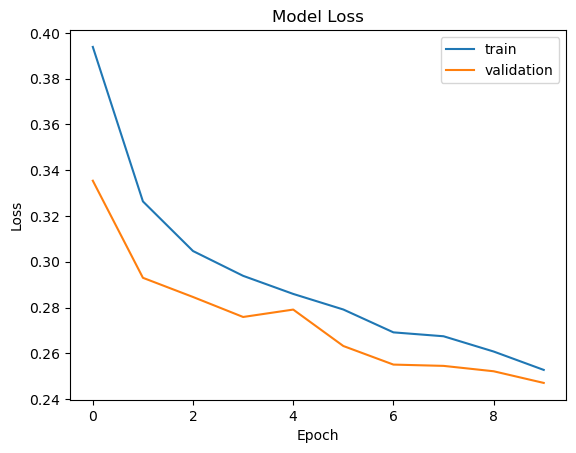

In [34]:
# Plotting train and validation loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['train', 'validation'], loc='upper right')
plt.show()

In [38]:

y_pred_prob = cnn_lstm_model.predict(X_test)

# Get the class labels as integers
# y_pred = np.argmax(y_pred_prob, axis=1)
y_pred = [1 if each > 0.5 else 0 for each in y_pred_prob ]

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))


281/281 [==============================] - 2s 8ms/step
Accuracy: 0.8979955456570156
Precision: 0.8712483688560244
Recall: 0.9251732101616628
F1 Score: 0.8974014336917563


In [36]:
import shap

explainer = shap.Explainer(cnn_lstm_model, X_test)
shap_values = explainer(X_test)

KeyboardInterrupt: 

In [ ]:
shap.summary_plot(shap_values, X_test, plot_type='bar')

### GeFES on above models

In [42]:
cnn_lstm_model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
models.append(cnn_lstm_model)

In [21]:
data_bc = final_df.drop(columns = 'target')
label_bc = final_df['target']
X_train,X_test, Y_train, Y_test = train_test_split(data_bc, label_bc,stratify= label_bc, test_size=0.2, random_state=42)
Y_train.value_counts()

0    18785
1    17133
Name: target, dtype: int64

In [ ]:
best_df = {}
score_df = {}
for logmodel in models:
    print("Model:- ", type(logmodel).__name__)
    chromo_df_bc,score_bc=generations(data_bc,label_bc,size=80,n_feat=data_bc.shape[1],n_parents=64,mutation_rate=0.20,n_gen=5,
                             X_train = X_train,X_test = X_test,Y_train = Y_train,Y_test = Y_test)
    best_df[type(logmodel).__name__] = chromo_df_bc
    score_df[type(logmodel).__name__] = score_bc
    

Model:-  LogisticRegression
BEST Precision: [0.848050728041334]
BEST Recall: [0.8429038281979458]
BEST F1 score: [0.8454694450948256]
Best score in generation 1 : [0.8530066815144766]
BEST Precision: [0.8496312157982393]
BEST Recall: [0.8335667600373483]
BEST F1 score: [0.8415223282667609]
Best score in generation 2 : [0.8502227171492205]
BEST Precision: [0.846912420756046]
BEST Recall: [0.8419701213818861]
BEST F1 score: [0.8444340395645558]
Best score in generation 3 : [0.8520044543429844]
BEST Precision: [0.8439047394482433]
BEST Recall: [0.8354341736694678]
BEST F1 score: [0.8396480938416422]
Best score in generation 4 : [0.8477728285077951]
BEST Precision: [0.8429810171080384]
BEST Recall: [0.8396358543417367]
BEST F1 score: [0.8413051105133903]
Best score in generation 5 : [0.8488864142538975]
Model:-  KNeighborsClassifier
BEST Precision: [0.7721426838146082]
BEST Recall: [0.7427637721755369]
BEST F1 score: [0.7571683521713266]
Best score in generation 1 : [0.77271714922049]
BEST

In [53]:
data.shape

(44898, 100)

In [54]:
logmodel=cnn_lstm_model
X_train, X_test, y_train, y_test = train_test_split(pd.DataFrame(data), df['target'], test_size=0.2, random_state=42)
data_bc = pd.DataFrame(data)
label_bc = df['target']
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)
chromo_df_bc,score_bc=generations(data_bc,label_bc,size=80,n_feat=data_bc.shape[1],n_parents=64,mutation_rate=0.20,n_gen=5,
X_train = X_train,X_test = X_test,Y_train = Y_train,Y_test = Y_test)
best_df[type(logmodel).__name__] = chromo_df_bc
score_df[type(logmodel).__name__] = score_bc

(35918, 100) (8980, 100) (35918,) (8980,)


ValueError: in user code:

    File "/home/016651544/anaconda3/lib/python3.10/site-packages/keras/engine/training.py", line 1284, in train_function  *
        return step_function(self, iterator)
    File "/home/016651544/anaconda3/lib/python3.10/site-packages/keras/engine/training.py", line 1268, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "/home/016651544/anaconda3/lib/python3.10/site-packages/keras/engine/training.py", line 1249, in run_step  **
        outputs = model.train_step(data)
    File "/home/016651544/anaconda3/lib/python3.10/site-packages/keras/engine/training.py", line 1050, in train_step
        y_pred = self(x, training=True)
    File "/home/016651544/anaconda3/lib/python3.10/site-packages/keras/utils/traceback_utils.py", line 70, in error_handler
        raise e.with_traceback(filtered_tb) from None
    File "/home/016651544/anaconda3/lib/python3.10/site-packages/keras/engine/input_spec.py", line 298, in assert_input_compatibility
        raise ValueError(

    ValueError: Input 0 of layer "sequential" is incompatible with the layer: expected shape=(None, 100), found shape=(None, 70)


# Prediction- How much accurately can we predict if the News is True or Fake just from the Title?

In [14]:
X_train, X_test, y_train, y_test = train_test_split(df.clean_joined_title, df.target, test_size = 0.2,random_state=2)
vec_train = CountVectorizer().fit(X_train)
X_vec_train = vec_train.transform(X_train)
X_vec_test = vec_train.transform(X_test)

In [15]:
model = LogisticRegression(C=2)
model.fit(X_vec_train, y_train)
predicted_value = model.predict(X_vec_test)
accuracy_value = roc_auc_score(y_test, predicted_value)
print(accuracy_value)

0.9475943910154114


/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



**Observations** Damn! 94.75% accuarte prediction is quite a good result (Didn't expect it though :P). Now lets take a look at the confusion Matrix for this model using just the title

# The Confusion Matrix
![](https://images.sadhguru.org/sites/default/files/media_files/iso/en/48257-confusion-clarity-spiritual-path.jpg)

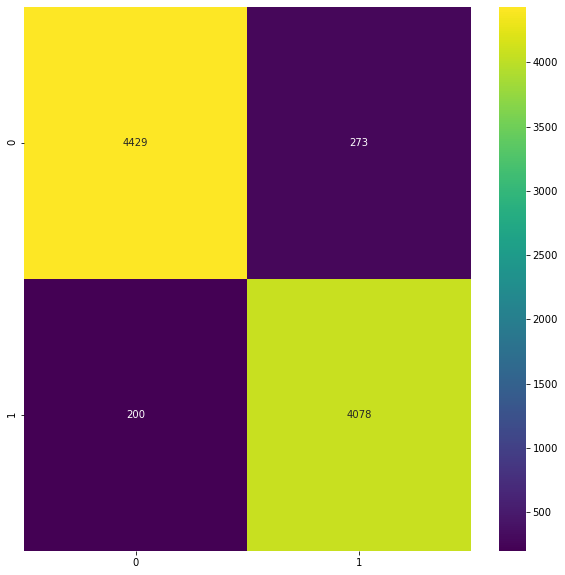

In [16]:
cm = confusion_matrix(list(y_test), predicted_value)
plt.figure(figsize = (10, 10))
sns.heatmap(cm, annot = True,fmt='g',cmap='viridis')

**Observations** 4465 Fake News have been Classified as Fake, while 4045 Real News have been classified as Real! Well Done! But we see we still have 470 titles that are misleading and are classified wrong. 

Lets think in a different approach- maybe considering the content of the News to Predict if the News if True of Fake!

# Lets Check if the Content of the News is enough to predict if the news if fake or not? Lets us see in the following analysis

In [17]:
df['clean_text'] = df['text'].apply(preprocess)
df['clean_joined_text']=df['clean_text'].apply(lambda x:" ".join(x))

# Lets Create the Word Clouds for the News Content Now!

# Word Cloud using the Real News Writeups


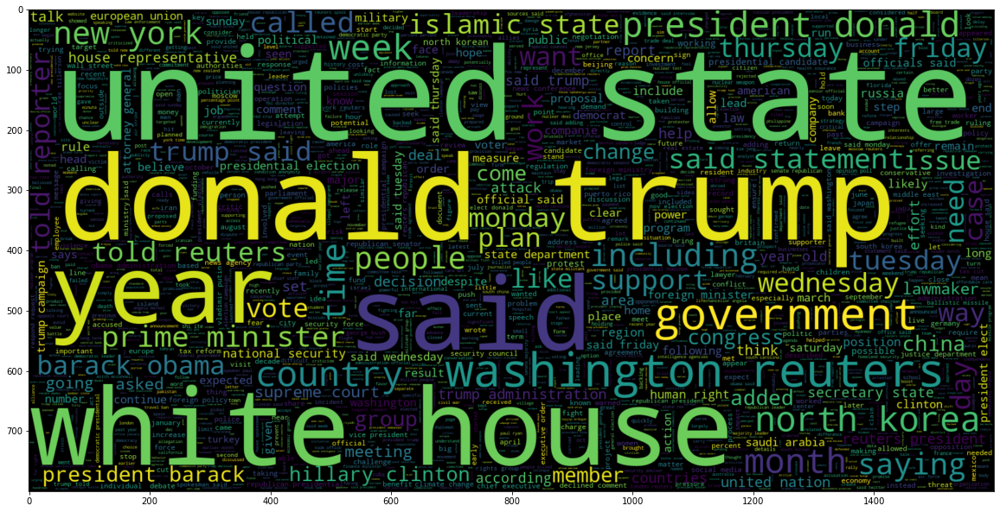

In [18]:
plt.figure(figsize = (20,20)) 
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800 , stopwords = stop_words).generate(" ".join(df[df.target == 1].clean_joined_text))
plt.imshow(wc, interpolation = 'bilinear')

# Now Creating a Word Cloud using the Fake News Writeups

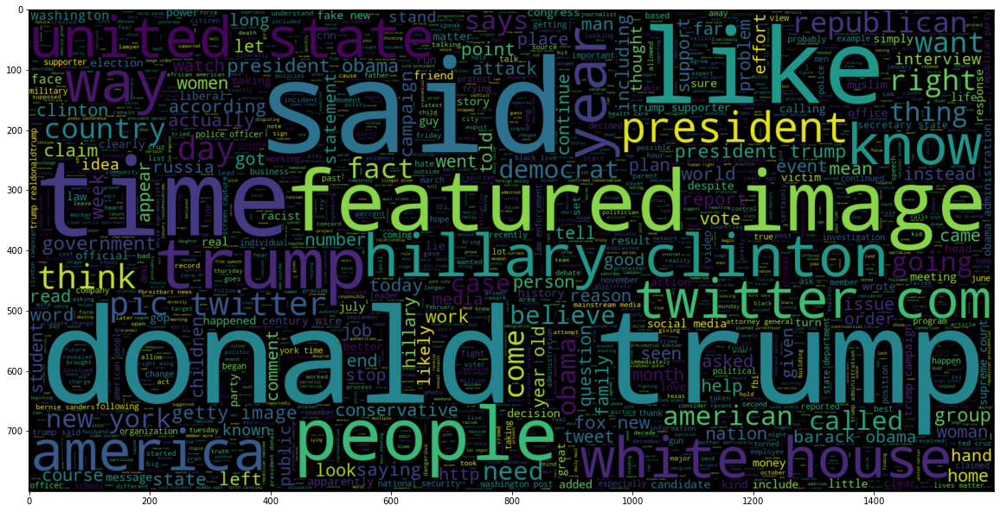

In [19]:
plt.figure(figsize = (20,20)) 
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800 , stopwords = stop_words).generate(" ".join(df[df.target == 0].clean_joined_text))
plt.imshow(wc, interpolation = 'bilinear')

# Lets try to identify the distribution of word counts in the texts

In [20]:
maxlen = -1
for doc in df.clean_joined_text:
    tokens = nltk.word_tokenize(doc)
    if(maxlen<len(tokens)):
        maxlen = len(tokens)
print("The maximum number of words in a News Content is =", maxlen)
fig = px.histogram(x = [len(nltk.word_tokenize(x)) for x in df.clean_joined_text], nbins = 50)
fig.show()

The maximum number of words in a News Content is = 4573


**Observation** As we can see most of the News articles are within a range of 100-200 words. Anything beyond this point is not very catchy, and even the mdia tends to avoid. But yes when the number of words are such large, it will be much easier for the model to predict. We hope the newer accuracy is much more than the Title model. Lets check it out in our next section

# Lets Predict!!!


In [21]:

X_train, X_test, y_train, y_test = train_test_split(df.clean_joined_text, df.target, test_size = 0.2,random_state=2)
vec_train = CountVectorizer().fit(X_train)
X_vec_train = vec_train.transform(X_train)
X_vec_test = vec_train.transform(X_test)
model = LogisticRegression(C=2.5)
model.fit(X_vec_train, y_train)
predicted_value = model.predict(X_vec_test)
accuracy_value = roc_auc_score(y_test, predicted_value)
print(accuracy_value)

0.9953661308915527


/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



**Observation** WoooW! 99.53% That's quite an improvement. Much better than predicting from the titles. Indeed its rightly said, never judge a book by its cover, nor a news by its title. Having such a great accuracy lets for once take a look into the Confusion Matrix

# The Confusion Matrix


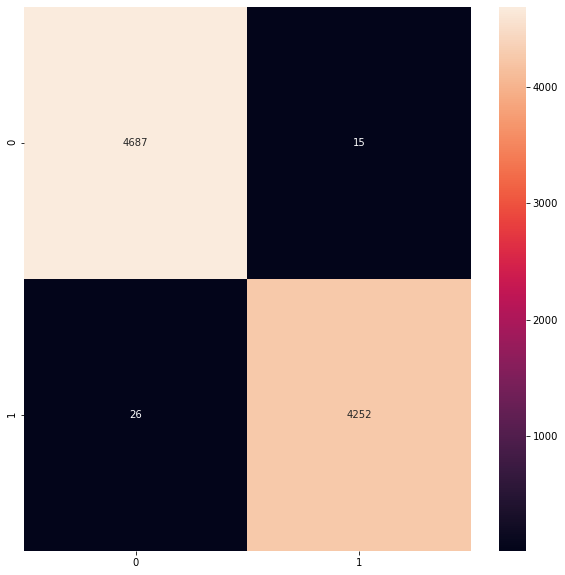

In [22]:
prediction = []
for i in range(len(predicted_value)):
    if predicted_value[i].item() > 0.5:
        prediction.append(1)
    else:
        prediction.append(0)
cm = confusion_matrix(list(y_test), prediction)
plt.figure(figsize = (10, 10))
sns.heatmap(cm, annot = True,fmt='g')

**Observation** This is Awesome! 4662 Contents of Fake News were classified as Fake, while 4281 Real ones were rightly predicted as well. Now we have only 41 missclassified sets. Massive improvement from our first model. But can we try to improve this any further?
What if, we combine the title and content, would it give us any better result- No harm in trying. Lets check that out in the following section

# Lets try to analyze, how accurately can we predict if we consider the entire news- Title and Content!!!

In [23]:
df['clean_final'] = df['original'].apply(preprocess)
df['clean_joined_final']=df['clean_final'].apply(lambda x:" ".join(x))

In [24]:
X_train, X_test, y_train, y_test = train_test_split(df.clean_joined_final, df.target, test_size = 0.2,random_state=0)
vec_train = CountVectorizer().fit(X_train)
X_vec_train = vec_train.transform(X_train)
X_vec_test = vec_train.transform(X_test)
model = LogisticRegression(C=3)
model.fit(X_vec_train, y_train)
predicted_value = model.predict(X_vec_test)
accuracy_value = roc_auc_score(y_test, predicted_value)
print(accuracy_value)

0.9966717508706907


/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



**Observation** 99.67%!!! Quite Perfect Score! So considering both the title and the content of the news we have been able to predict the nature of the news! For our final consolation, lets take a look at the confusion matrix!

# Confusion Matrix

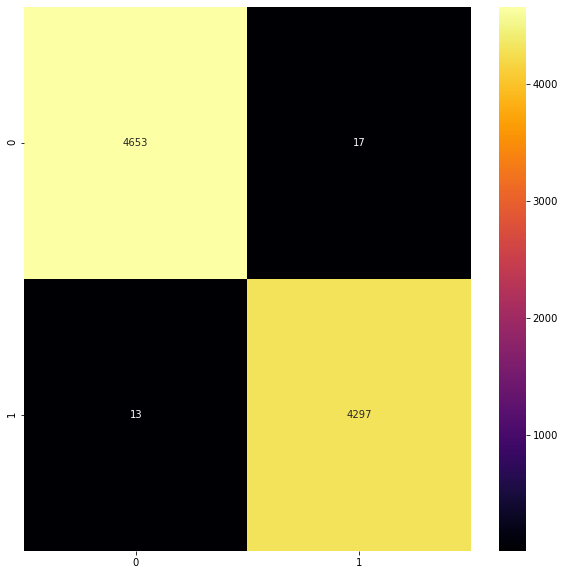

In [25]:
prediction = []
for i in range(len(predicted_value)):
    if predicted_value[i].item() > 0.5:
        prediction.append(1)
    else:
        prediction.append(0)
cm = confusion_matrix(list(y_test), prediction)
plt.figure(figsize = (10, 10))
sns.heatmap(cm, annot = True,fmt='g',cmap='inferno')

**Observation** Awesome!!!! Now we are ready with our target of news Classification!

# Conclusion

![](https://www.zerys.com/hubfs/shutterstock_138382064_edited.jpg)

We have been succesfully able to reach the target for classifying a News- and are able to identify if this is a True or Fake. However would like to highligh ton a few points as mentioned below:
1. Its not much feasible to predict the news just from its title. **"Titles are misleading!!"**
2. A much better Idea was obtained when we considered the article context for the News. The accuracy percentages shot up from 94% to 99+%. Drastic Improvement it is!
3. Considering both the title and the context, we have been able to reach the highest percentages of accuracy. I shall be working on to implement further models that would give even better results.

Regarding the data, would like to add on a few points:
1. The Data obtained was clean, hence didn't require to go for much data cleaning. Have made certain modifications as per my own requirement.
2. A higher volume input would be better for the model to train- will be thinking on those lines and trying to improve this further
